In [1]:
import torch
torch.cuda.memory_cached()
import os
import torch
import torch.nn as nn
import numpy as np
import torch.optim as optim
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
import pandas as pd
from torch.utils.data import Dataset, DataLoader, Subset
# from torchvision import transforms
from PIL import Image
from torchvision import models, transforms

from sklearn.model_selection import train_test_split
import optuna
import sys
import matplotlib.pyplot as plt
import numpy as np
import cv2
from torchvision.transforms.functional import to_tensor, to_pil_image
import best_modelo_general as bmg
import best_modelo_general_colon as bmgc
import best_modelo_general_lung as bmgl
import best_modelo_general_gastrointestinal as bmgg
import best_modelo_general_oral as bmgo

# Aca va el optmizador de profundidad
import opt_deep_analysis as opt_deep

sys.path.append("C:/Users/Matias/Desktop/Tesis/Tesis-Codes/utils")
import creacion_df_torch as qol



dataset_dir = r"C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias"

# Preparar datos
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
df = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='all')
train_loader, val_loader, test_loader = qol.prepare_data_loaders(df, batch_size=80, m_type='bin')

#Preparamos
import os
import pandas as pd

# Ruta al directorio del dataset
dataset_dir = r"C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias"

    


df['Combinaciones'] = df['etiqueta'].astype(str) + "_" + df['tipo_cancer'].astype(str)
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df, test_size=0.3, random_state=46, stratify=df['Combinaciones'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['Combinaciones'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\cuda\memory.py:444: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\ACA\colon_ACA_colonca774.jpeg


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\cuda\memory.py:444: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  warnings.warn(


In [2]:
df

,ruta,etiqueta,tipo_cancer,Combinaciones
0,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,colon,maligno_colon
1,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,colon,maligno_colon
2,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,colon,maligno_colon
3,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,colon,maligno_colon
4,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,colon,maligno_colon
...,...,...,...,...
46517,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,benigno,oral,benigno_oral
46518,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,benigno,oral,benigno_oral
46519,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,benigno,oral,benigno_oral
46520,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,benigno,oral,benigno_oral


In [3]:
test_loader

In [25]:
test_df 

,ruta,etiqueta,tipo_cancer
19284,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,oral
24581,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,oral
23070,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,oral
19725,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,oral
26163,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,oral
...,...,...,...
44885,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,benigno,oral
27070,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,oral
27645,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,maligno,oral
46099,C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...,benigno,oral


In [4]:
#Contamos los diferentes valores de test_df
test_df['tipo_cancer'].value_counts() 

tipo_cancer
lung                1485
oral                1335
colon                990
gastrointestinal     796
Name: count, dtype: int64

## Matriz de confusión

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import itertools

def plot_confusion_matrix(cm, classes, ruta, normalize=False, title='Matriz de Confusión', cmap=plt.cm.Blues):
    """
    Esta función imprime y grafica la matriz de confusión.
    La normalización puede aplicarse estableciendo `normalize=True`.
    """
    plt.figure(figsize=(8, 8))
    plt.title(title)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        cm = np.round(cm, decimals=3)
        print("Matriz de confusión normalizada")
    else:
        print('Matriz de confusión sin normalización')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.colorbar()

    plt.tight_layout()
    plt.ylabel('Etiqueta real')
    plt.xlabel('Etiqueta predicha')
    plt.show()
    plt.savefig(f'{ruta}/{title}.png')



### Redes preentrenadas

In [3]:
import pandas as pd
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50, VGG16, DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import pickle
from sklearn.model_selection import train_test_split

def crear_dataframe(dataset_dir):
    subcarpetas = ['benigno', 'maligno']
    data = {'ruta': [], 'etiqueta': [], 'tipo': []}
    
    for subcarpeta in subcarpetas:
        dir_path = os.path.join(dataset_dir, subcarpeta)
        for filename in os.listdir(dir_path):
            parts = filename.split('_')
            
            if len(parts) > 2 and (parts[0] == 'oral'):
                tipo_cancer = parts[0]
                etiqueta = parts[1]
            elif len(parts) == 3:
                tipo_cancer, etiqueta, _ = parts
            else:
                print(f"Archivo {filename} ignorado por tener un formato incorrecto.")
                continue
                
            ruta_completa = os.path.join(dir_path, filename)
            data['ruta'].append(ruta_completa)
            data['etiqueta'].append(etiqueta)
            data['tipo'].append(tipo_cancer)
    
    return pd.DataFrame(data)

def dividir_dataframe(df, test_size=0.2, val_size=0.25, random_state=42):
    df_train, df_temp = train_test_split(df, test_size=test_size, random_state=random_state)
    df_val, df_test = train_test_split(df_temp, test_size=val_size, random_state=random_state)
    return df_train, df_val, df_test

def crear_generadores_por_tipo(df_train, df_val, target_size=(256, 256), batch_size=20):
    datagen = ImageDataGenerator(rescale=1./255)
    
    train_generator = datagen.flow_from_dataframe(
        dataframe=df_train,
        x_col='ruta',
        y_col='etiqueta',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',
        shuffle=True
    )
    
    validation_generator = datagen.flow_from_dataframe(
        dataframe=df_val,
        x_col='ruta',
        y_col='etiqueta',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',
        shuffle=False
    )
    
    return train_generator, validation_generator

def crear_generador_test(df_test, target_size=(256, 256), batch_size=20):
    datagen = ImageDataGenerator(rescale=1./255)
    
    test_generator = datagen.flow_from_dataframe(
        dataframe=df_test,
        x_col='ruta',
        y_col='etiqueta',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',
        shuffle=False
    )
    
    return test_generator

# Función para calcular métricas
def calcular_metricas(model, generator):
    y_true = generator.classes
    y_pred_prob = model.predict(generator)
    y_pred = (y_pred_prob > 0.5).astype(int)

    accuracy = accuracy_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    
    return accuracy, recall, precision, f1

def get_pretrained_model(model_name, input_shape=(256, 256, 3), num_classes=1):
    if model_name == 'resnet':
        base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    elif model_name == 'vgg':
        base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    elif model_name == 'densenet':
        base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)
    else:
        raise ValueError("Unsupported model name")

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu')(x)
    predictions = Dense(num_classes, activation='sigmoid')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    for layer in base_model.layers:
        layer.trainable = False

    return model

def entrenar_modelo(model, train_gen, val_gen, tipo_cancer, model_name, epochs=30):
    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    history = model.fit(train_gen,
                        epochs=epochs,
                        validation_data=val_gen)

    model_dir = f'C:/Users/Matias/OneDrive/Escritorio/Tesis/Tesis-Models/Model_Analsis_final/{tipo_cancer}_pretrained_models'
    os.makedirs(model_dir, exist_ok=True)
    model.save(os.path.join(model_dir, f'{tipo_cancer}_modelo_{model_name}.h5'))
    
    with open(os.path.join(model_dir, f'{tipo_cancer}_historial_{model_name}.pickle'), 'wb') as f:
        pickle.dump(history.history, f)
    
    return model, history



# Función para ocultar secciones de la imagen
def ocultar_seccion(imagen, top_left, tamano, valor_ocultacion=0.5):
    imagen_modificada = np.copy(imagen)
    x, y = top_left
    ancho, alto = tamano
    imagen_modificada[y:y+alto, x:x+ancho, :] = valor_ocultacion
    return imagen_modificada

# Función para generar y mostrar el mapa de calor
def generar_mostrar_mapa_calor(ruta_imagen, modelo, model_name, tamano_parche=32, paso=16, device='cpu'):
    # Cargar y procesar la imagen
    imagen = Image.open(ruta_imagen).convert('RGB')
    imagen = imagen.resize((256, 256))  # Redimensionar la imagen si es necesario
    imagen_array = np.array(imagen) / 255.0  # Normalizar la imagen
    imagen_tensor = torch.tensor(imagen_array).permute(2, 0, 1).unsqueeze(0).to(device)  # Convertir a tensor y añadir batch

    # Inicializar el mapa de calor
    mapa_calor = np.zeros((imagen_array.shape[0], imagen_array.shape[1]))

    # Pasar la imagen por el modelo para obtener predicciones
    modelo.eval()
    with torch.no_grad():
        prediccion_original = modelo(imagen_tensor)  # Obtener la predicción del modelo
        prediccion_original = torch.softmax(prediccion_original, dim=1)
        clase_predicha = 'maligno' if prediccion_original.argmax() == 1 else 'benigno'

    # Crear el mapa de calor
    for y in range(0, imagen_array.shape[0] - tamano_parche, paso):
        for x in range(0, imagen_array.shape[1] - tamano_parche, paso):
            parche = imagen_tensor[:, :, y:y + tamano_parche, x:x + tamano_parche]
            salida = modelo(parche)
            salida = torch.softmax(salida, dim=1)
            importancia = salida[0, 1].item()  # Importancia de la clase "maligna"
            mapa_calor[y:y + tamano_parche, x:x + tamano_parche] = importancia

    # Normalizar el mapa de calor
    mapa_calor = mapa_calor / np.max(mapa_calor)

    # Mostrar la imagen y el mapa de calor
    plt.imshow(imagen)
    plt.imshow(mapa_calor, cmap='jet', alpha=0.5)
    plt.title(f"Mapa de calor - {clase_predicha}")
    plt.show()

    # Guardar el mapa de calor
    nombre_salida = os.path.join(os.path.dirname(ruta_imagen), f"{model_name}_mapa_calor.png")
    plt.savefig(nombre_salida)
    print(f"Mapa de calor guardado en: {nombre_salida}")

# Función para aplicar el modelo a una carpeta de imágenes
def aplicar_modelo_a_carpeta(carpeta, modelo, model_name, tamano_parche=32, paso=16):
    for nombre_archivo in os.listdir(carpeta):
        ruta_completa = os.path.join(carpeta, nombre_archivo)
        if nombre_archivo.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
            print(f"Procesando imagen: {nombre_archivo}")
            generar_mostrar_mapa_calor(ruta_completa, modelo, model_name, tamano_parche=tamano_parche, paso=paso)






# Modelos Binarios Cancer-No Cancer

## Modelo General 4 tipos de Cancer

### Mejor modelo iteraciones

In [4]:

# Entrenar modelo
'''model_bmg = bmg.train_model(device, train_loader, val_loader)
#Cargamos el modelo si ya lo tenemos entrenado
# Guardar el estado del diccionario de cada modelo
torch.save(model_bmg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pth')
torch.save(model_bmg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pt')

# Evaluar modelo
test_accuracy, test_loss = qol.evaluate_model(device, model_bmg, test_loader)
print(f'Final Test Accuracy: {test_accuracy:.4f}')


try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmg, val_loader, test_loader)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')'''

"model_bmg = bmg.train_model(device, train_loader, val_loader)\n#Cargamos el modelo si ya lo tenemos entrenado\n# Guardar el estado del diccionario de cada modelo\ntorch.save(model_bmg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pth')\ntorch.save(model_bmg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pt')\n\n# Evaluar modelo\ntest_accuracy, test_loss = qol.evaluate_model(device, model_bmg, test_loader)\nprint(f'Final Test Accuracy: {test_accuracy:.4f}')\n\n\ntry:\n    # Ejemplo de uso\n    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmg, val_loader, test_loader)\n    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')\n    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')\nexcept:\n    print('error')"

In [5]:


# Verificar si hay una GPU disponible y mover el modelo al dispositivo adecuado
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar el modelo completo desde el archivo
model_bmg = torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pth')
model_bmg.to(device)

# Poner el modelo en modo de evaluación
model_bmg.eval()

# Evaluar modelo cargado
try:
    # Evaluar el modelo cargado
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmg, val_loader, test_loader)
    
    # Acceder a los valores para validación
    val_accuracy, val_recall, val_precision, val_f1, val_cm, val_loss, val_loss_list = val_metrics
    
    # Acceder a los valores para test
    test_accuracy, test_recall, test_precision, test_f1, test_cm, test_loss, test_loss_list = test_metrics

    # Imprimir las métricas y listas de pérdidas
    print(f'Validation Accuracy: {val_accuracy:.4f}')
    print(f'Validation Loss (avg): {val_loss:.4f}')
    print(f'Validation Loss List: {val_loss_list}')
    
    print(f'Test Accuracy: {test_accuracy:.4f}')
    print(f'Test Loss (avg): {test_loss:.4f}')
    print(f'Test Loss List: {test_loss_list}')
    print(f'Test Recall: {test_recall:.4f}')
    print(f'Test Precision: {test_precision:.4f}')
    print(f'Test F1: {test_f1:.4f}')
    print(f'Test Confusion Matrix:\n{test_cm}')
    

except Exception as e:
    print(f'Error: {e}')



Validation Accuracy: 0.9721
Validation Loss (avg): 0.1058
Validation Loss (list): [0.20558485388755798, 0.008382333442568779, 0.027295956388115883, 0.4074791371822357, 0.17445345222949982, 0.10974341630935669, 0.0005278590251691639, 0.10072778165340424, 0.040890004485845566, 0.0913153663277626, 0.11309045553207397, 0.030261754989624023, 0.23825006186962128, 0.1932617574930191, 0.02981908619403839, 0.09308614581823349, 0.022611740976572037, 0.3622800409793854, 0.0686635673046112, 0.1405530422925949, 0.038258664309978485, 0.2735423147678375, 0.18942955136299133, 0.12090154737234116, 0.26708751916885376, 0.10758471488952637, 0.08773626387119293, 0.003937101922929287, 0.02373785898089409, 0.04649798572063446, 0.1220136508345604, 0.11469247192144394, 0.013104841113090515, 0.034550100564956665, 0.18859906494617462, 0.14787128567695618, 0.08430121839046478, 0.020542768761515617, 0.2354237139225006, 0.04869411140680313, 0.16275763511657715, 0.014296124689280987, 0.06235922500491142, 0.02641317

In [ ]:
# Evaluar modelo cargado
try:
    # Evaluar el modelo cargado
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmg, val_loader, test_loader)
    
    # Acceder a los valores para validación
    val_accuracy, val_recall, val_precision, val_f1, val_cm, val_loss, val_loss_list = val_metrics
    
    # Acceder a los valores para test
    test_accuracy, test_recall, test_precision, test_f1, test_cm, test_loss, test_loss_list = test_metrics

    # Imprimir las métricas y listas de pérdidas
    print(f'Validation Accuracy: {val_accuracy:.4f}')
    print(f'Validation Loss (avg): {val_loss:.4f}')
    print(f'Validation Loss List: {val_loss_list}')
    
    print(f'Test Accuracy: {test_accuracy:.4f}')
    print(f'Test Loss (avg): {test_loss:.4f}')
    print(f'Test Loss List: {test_loss_list}')
    print(f'Test Recall: {test_recall:.4f}')
    print(f'Test Precision: {test_precision:.4f}')
    print(f'Test F1: {test_f1:.4f}')
    print(f'Test Confusion Matrix:\n{test_cm}')
    

except Exception as e:
    print(f'Error: {e}')


Matriz de confusión sin normalización


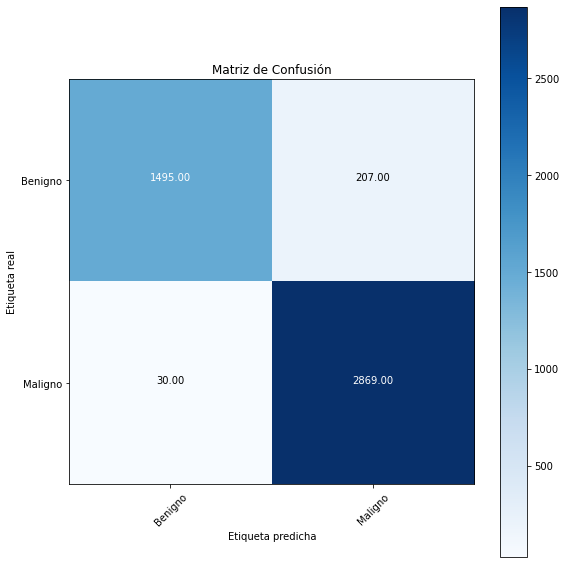

<Figure size 432x288 with 0 Axes>

In [ ]:
# Matriz de confusión proporcionada
conf_matrix = np.array([[1599, 109], [25, 2873]])

# Etiquetas de las clases (ajustar según tu caso)
class_names = ['Benigno', 'Maligno']

# Ruta donde se guardará el gráfico
ruta = "C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/General"  # Cambia esto a la ruta de tu preferencia

# Llamada a la función para graficar
plot_confusion_matrix(conf_matrix, classes=class_names, ruta=ruta, normalize=False)

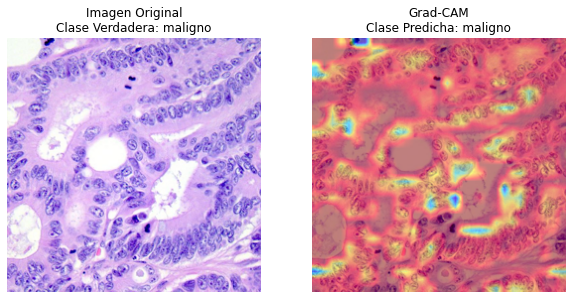

Imagen guardada en: C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/General\colon_ACA_colonca57_model_bmg_mapa_calor.png


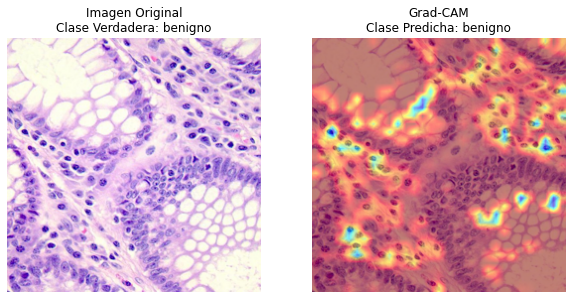

Imagen guardada en: C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/General\colon_benigno_colonn2_model_bmg_mapa_calor.png


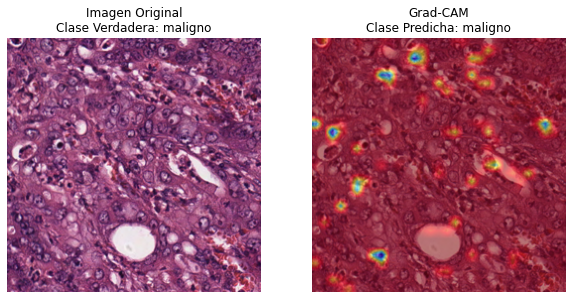

Imagen guardada en: C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/General\gastrointestinal_ACA_TUM-WELFIIYAYYLD_model_bmg_mapa_calor.png


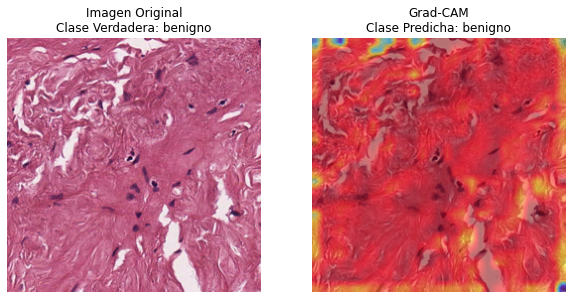

Imagen guardada en: C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/General\gastrointestinal_benigno_STR-VRNKRDTEHGTG_model_bmg_mapa_calor.png


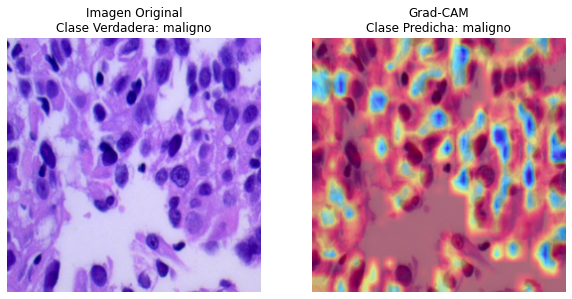

Imagen guardada en: C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/General\lung_ACA_lungaca997_model_bmg_mapa_calor.png


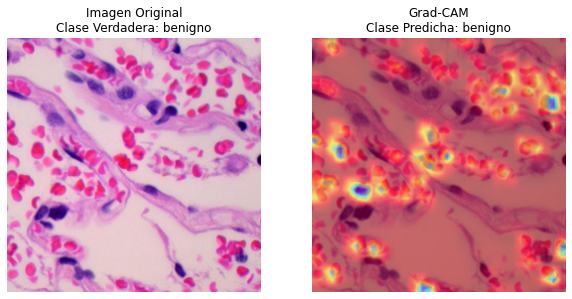

Imagen guardada en: C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/General\lung_benigno_lungn711_model_bmg_mapa_calor.png


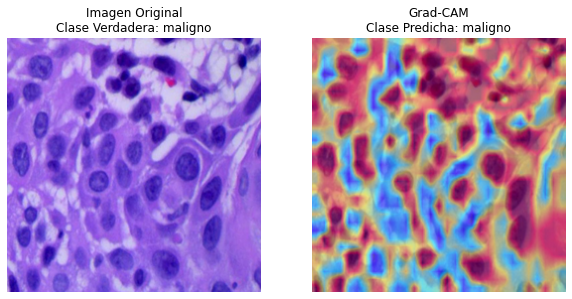

Imagen guardada en: C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/General\lung_SCC_lungscc52_model_bmg_mapa_calor.png


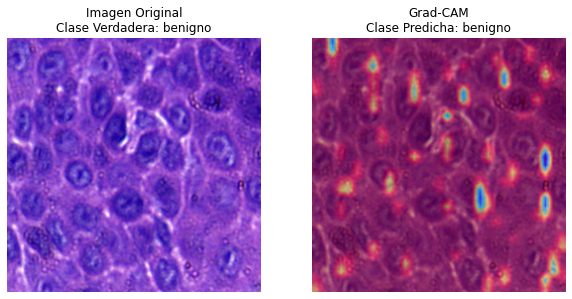

Imagen guardada en: C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/General\oral_benigno_Normal_400x_71_1_6d9b7fc6-da8b-452c-b365-de388a4bb4be_1_model_bmg_mapa_calor.png


In [ ]:

'''
# Función para identificar si una imagen es benigna o maligna basándose en su nombre
def obtener_clase_verdadera(nombre_archivo):
    if "SCC" in nombre_archivo or "ACA" in nombre_archivo:
        return "maligno"
    else:
        return "benigno"

# Lista de rutas de imágenes
carpeta_imagenes = r"C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/General"
image_paths = [os.path.join(carpeta_imagenes, nombre_archivo) for nombre_archivo in os.listdir(carpeta_imagenes) 
               if nombre_archivo.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif'))]

# Iterar sobre cada imagen en la lista
for image_path in image_paths:
    nombre_archivo = os.path.basename(image_path)
    clase_verdadera = obtener_clase_verdadera(nombre_archivo)
    
    # Cargar y preparar la imagen
    imagen = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    imagen_tensor = transform(imagen).unsqueeze(0).to(device)  # Añadir batch dimension (1, 3, 256, 256)

    # Obtener la predicción del modelo
    model_bmg.eval()
    with torch.no_grad():
        output = model_bmg(imagen_tensor)
    _, class_idx = torch.max(output, 1)
    class_idx = class_idx.item()  # Convertir a entero

    # Crear una instancia de GradCAM
    target_layer = model_bmg.features[-1]  # Última capa convolucional
    grad_cam = qol.GradCAM(model_bmg, target_layer)

    # Generar el mapa de calor
    mask = grad_cam.generate(imagen_tensor.squeeze(0), class_idx=class_idx)  # Remover la dimensión batch para GradCAM

    # Mostrar la imagen con el mapa de calor
    imagen_np = np.array(imagen.resize((256, 256))) / 255.0
    cam_image = qol.show_cam_on_image(imagen_np, mask)

    # Definir etiquetas de clase si están disponibles
    class_labels = ['benigno', 'maligno']  # Ajusta esto según tu problema

    # Obtener el nombre de la clase predicha
    predicted_class = class_labels[class_idx] if class_labels else str(class_idx)

    plt.figure(figsize=(10, 5))
    
    # Imagen original con clase verdadera
    plt.subplot(1, 2, 1)
    plt.imshow(imagen_np)
    plt.title(f'Imagen Original\nClase Verdadera: {clase_verdadera}')
    plt.axis('off')

    # Imagen con Grad-CAM
    plt.subplot(1, 2, 2)
    plt.imshow(cam_image)
    plt.title(f'Grad-CAM\nClase Predicha: {predicted_class}')
    plt.axis('off')

    # Mostrar las imágenes
    plt.show()

    # Guardar la imagen con el mapa de calor
    nombre_salida = f"{os.path.splitext(nombre_archivo)[0]}_model_bmg_mapa_calor.png"
    ruta_salida = os.path.join(carpeta_imagenes, nombre_salida)
    cv2.imwrite(ruta_salida, cam_image)
    print(f"Imagen guardada en: {ruta_salida}")'''


In [ ]:
'''# Aplicar el modelo a una carpeta de imágenes
carpeta_imagenes = r"C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/General"
aplicar_modelo_a_carpeta(carpeta_imagenes, model_bmg, model_name='model_bmg', tamano_parche=32, paso=16)

# Obtener y graficar la matriz de confusión para validación y test
val_cm = val_metrics[4]  # Matriz de confusión para validación
test_cm = test_metrics[4]  # Matriz de confusión para test

# Visualización de la matriz de confusión
plot_confusion_matrix(val_cm, ruta=carpeta_imagenes, classes=['Benigno', 'Maligno'], title='Matriz de Confusión general (Validación)')
plot_confusion_matrix(test_cm, ruta=carpeta_imagenes, classes=['Benigno', 'Maligno'], title='Matriz de Confusión general (Test)')'''




Procesando imagen: colon_ACA_colonca57.jpeg


AttributeError: 'Net' object has no attribute 'predict'

# Optimizacion profundidad

### Redes preentrenadas

In [ ]:
'''# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train, df_val, df_test = dividir_dataframe(df)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train, df_val)
test_gen = crear_generador_test(df_test)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'all', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    aplicar_modelo_a_carpeta(carpeta_imagenes, model, model_name ,tamano_parche=32, paso=16)
'''


DataFrames divididos con éxito
Found 36193 validated image filenames belonging to 2 classes.
Found 6777 validated image filenames belonging to 2 classes.
Found 2270 validated image filenames belonging to 2 classes.


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 978 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 192 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 54 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(


Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/10


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  20/1810 ━━━━━━━━━━━━━━━━━━━━ 12:35 422ms/step - accuracy: 0.5594 - loss: 1.1350

## Modelo Binario Colon

In [ ]:
df_colon = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='colon')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_colon, test_size=0.3, random_state=46, stratify=df_colon['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])

# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")
train_loader_colon, val_loader_colon, test_loader_colon = qol.prepare_data_loaders(df_colon, batch_size=80, m_type='bin')




Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\benigno\colon_benigno_colonn3544.jpeg


In [8]:

# Entrenar modelo
'''model_bmgc= bmgc.train_model(device, train_loader_colon, val_loader_colon)
torch.save(model_bmgc, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pth')
torch.save(model_bmgc, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pt')'''

model_bmgc = torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pth')
model_bmgc.to(device)

# Poner el modelo en modo de evaluación
model_bmgc.eval()



try:
    test_accuracy = qol.evaluate_model(device, model_bmgc, test_loader_colon)
    # Evaluar el modelo cargado
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgc, val_loader_colon, test_loader_colon)
    
    # Acceder a los valores para validación
    val_accuracy, val_recall, val_precision, val_f1, val_cm, val_loss, val_loss_list = val_metrics
    
    # Acceder a los valores para test
    test_accuracy, test_recall, test_precision, test_f1, test_cm, test_loss, test_loss_list = test_metrics

    # Imprimir las métricas y listas de pérdidas
    print(f'Validation Accuracy: {val_accuracy:.4f}')
    print(f'Validation Loss (avg): {val_loss:.4f}')
    print(f'Validation Loss List: {val_loss_list}')
    
    print(f'Test Accuracy: {test_accuracy:.4f}')
    print(f'Test Loss (avg): {test_loss:.4f}')
    print(f'Test Loss List: {test_loss_list}')
    print(f'Test Recall: {test_recall:.4f}')
    print(f'Test Precision: {test_precision:.4f}')
    print(f'Test F1: {test_f1:.4f}')
    print(f'Test Confusion Matrix:\n{test_cm}')
    

except Exception as e:
    print(f'Error: {e}')

print('Modelo General')
try:
    test_accuracy = qol.evaluate_model(device, model_bmg, test_loader_colon)
    # Evaluar el modelo cargado
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmg, val_loader_colon, test_loader_colon)
    
    # Acceder a los valores para validación
    val_accuracy, val_recall, val_precision, val_f1, val_cm, val_loss, val_loss_list = val_metrics
    
    # Acceder a los valores para test
    test_accuracy, test_recall, test_precision, test_f1, test_cm, test_loss, test_loss_list = test_metrics

    # Imprimir las métricas y listas de pérdidas
    print(f'Validation Accuracy: {val_accuracy:.4f}')
    print(f'Validation Loss (avg): {val_loss:.4f}')
    print(f'Validation Loss List: {val_loss_list}')
    
    print(f'Test Accuracy: {test_accuracy:.4f}')
    print(f'Test Loss (avg): {test_loss:.4f}')
    print(f'Test Loss List: {test_loss_list}')
    print(f'Test Recall: {test_recall:.4f}')
    print(f'Test Precision: {test_precision:.4f}')
    print(f'Test F1: {test_f1:.4f}')
    print(f'Test Confusion Matrix:\n{test_cm}')
    

except Exception as e:
    print(f'Error: {e}')


Test Accuracy: 0.9960
Validation Accuracy: 0.9975
Validation Loss (avg): 0.0083
Validation Loss (list): [0.0004325643240008503, 0.004853649530559778, 0.0005253131967037916, 0.01877986080944538, 1.4947127965569962e-05, 0.0027137636207044125, 0.00011822602391475812, 0.011699552647769451, 0.0032138247042894363, 0.0008240370079874992, 0.09302369505167007, 0.00033793473266996443, 0.01979203149676323, 0.000797678716480732, 0.01693081483244896, 0.008473646827042103, 0.00020935325301252306, 7.624107820447534e-05, 0.016526754945516586, 0.0010968514252454042, 0.0021884979214519262, 0.0002637106808833778, 0.00012974676792509854, 0.00037492491537705064, 0.0024467180483043194, 0.022059861570596695]
Test Accuracy: 0.9960
Test Loss (avg): 0.0105
Test Loss (list): [0.04482506215572357, 6.576241867151111e-05, 4.725615872303024e-05, 8.131882350426167e-05, 0.04236272722482681, 5.869703090866096e-05, 0.0002779924252536148, 0.0230927262455225, 0.010714150033891201, 0.00032628007465973496, 0.007081519812345

Matriz de confusión sin normalización


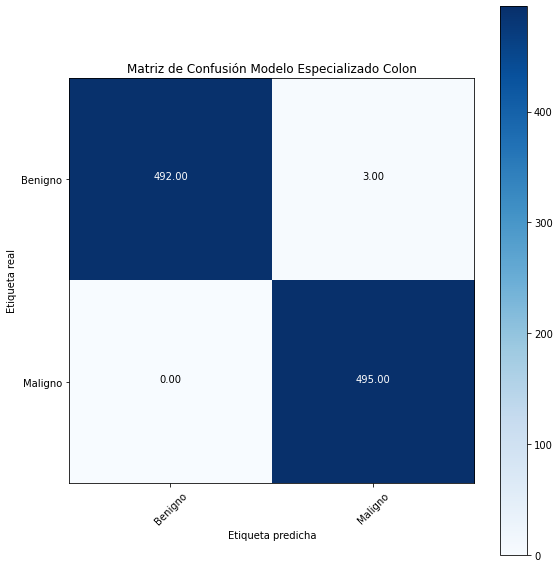

<Figure size 432x288 with 0 Axes>

In [ ]:
# Matriz de confusión proporcionada
conf_matrix = np.array([[492, 3], [0, 495]])

# Etiquetas de las clases (ajustar según tu caso)
class_names = ['Benigno', 'Maligno']

# Ruta donde se guardará el gráfico
ruta = "C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/Colon"  # Cambia esto a la ruta de tu preferencia

# Llamada a la función para graficar
plot_confusion_matrix(conf_matrix, classes=class_names, title='Matriz de Confusión Modelo Especializado Colon',ruta=ruta, normalize=False)




Matriz de confusión sin normalización


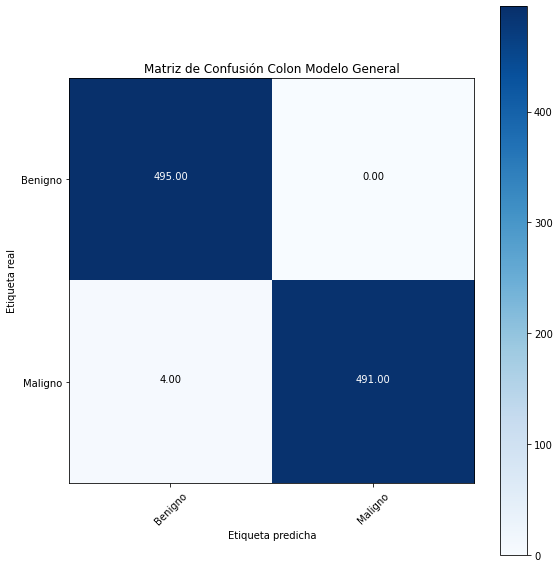

<Figure size 432x288 with 0 Axes>

In [10]:
# Matriz de confusión proporcionada
conf_matrix = np.array([[495, 0], [4, 491]])

# Etiquetas de las clases (ajustar según tu caso)
class_names = ['Benigno', 'Maligno']

# Ruta donde se guardará el gráfico
ruta = "C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/Colon"  # Cambia esto a la ruta de tu preferencia

# Llamada a la función para graficar
plot_confusion_matrix(conf_matrix, classes=class_names, title='Matriz de Confusión Colon Modelo General', ruta=ruta, normalize=False)

In [ ]:
carpeta_imagenes = r"C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/Colon"
aplicar_modelo_a_carpeta(carpeta_imagenes, model_bmgc,model_name= 'model_bmgc', tamano_parche=32, paso=16)

# Obtener y graficar la matriz de confusión para validación y test
val_cm = val_metrics[4]  # Matriz de confusión para validación
test_cm = test_metrics[4]  # Matriz de confusión para test

# Visualización de la matriz de confusión
plot_confusion_matrix(val_cm, ruta = carpeta_imagenes, classes=['Benigno', 'Maligno'], title='Matriz de Confusión colon (Validación)')
plot_confusion_matrix(test_cm, ruta = carpeta_imagenes, classes=['Benigno', 'Maligno'], title='Matriz de Confusión colon (Test)')

### Redes preentrenadas

DataFrames divididos con éxito
Found 8000 validated image filenames belonging to 2 classes.
Found 1500 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/10


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


400/400 ━━━━━━━━━━━━━━━━━━━━ 183s 451ms/step - accuracy: 0.6328 - loss: 0.7032 - val_accuracy: 0.7513 - val_loss: 0.5137
Epoch 2/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 180s 450ms/step - accuracy: 0.7428 - loss: 0.5345 - val_accuracy: 0.7407 - val_loss: 0.5284
Epoch 3/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 179s 448ms/step - accuracy: 0.7592 - loss: 0.5113 - val_accuracy: 0.8080 - val_loss: 0.4743
Epoch 4/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 180s 449ms/step - accuracy: 0.7790 - loss: 0.4828 - val_accuracy: 0.7420 - val_loss: 0.5148
Epoch 5/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 179s 448ms/step - accuracy: 0.7849 - loss: 0.4778 - val_accuracy: 0.7200 - val_loss: 0.5905
Epoch 6/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 180s 449ms/step - accuracy: 0.7819 - loss: 0.4815 - val_accuracy: 0.8153 - val_loss: 0.4356
Epoch 7/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 180s 448ms/step - accuracy: 0.7992 - loss: 0.4480 - val_accuracy: 0.8240 - val_loss: 0.4317
Epoch 8/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 180s 450ms/step - accuracy: 0.7968 - loss: 0.44

Modelo resnet entrenado con éxito
75/75 ━━━━━━━━━━━━━━━━━━━━ 29s 379ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 375ms/step
Final Validation Metrics for resnet: Accuracy=0.8293, Recall=0.7693, Precision=0.8801, F1=0.8210
Final Test Metrics for resnet: Accuracy=0.8220, Recall=0.7309, Precision=0.8922, F1=0.8035


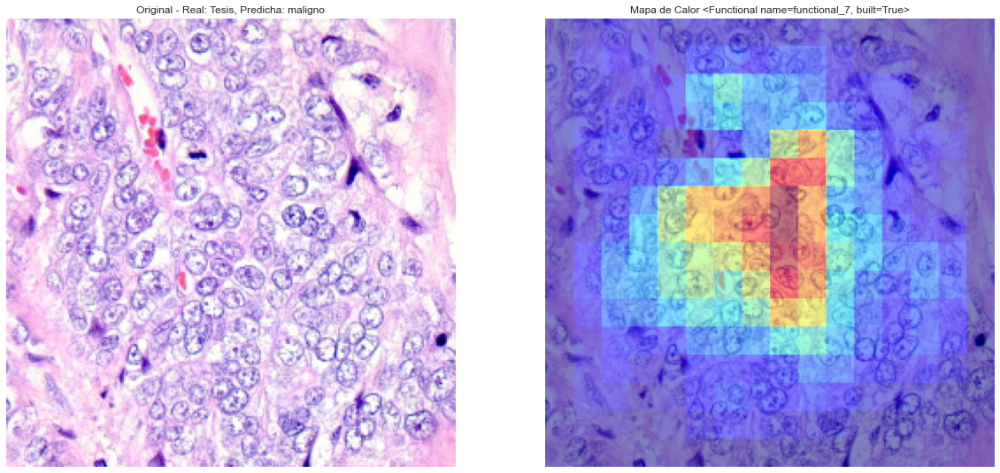

Entrenando el modelo vgg...
Epoch 1/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 420s 1s/step - accuracy: 0.9324 - loss: 0.1960 - val_accuracy: 0.9813 - val_loss: 0.0482
Epoch 2/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 419s 1s/step - accuracy: 0.9926 - loss: 0.0282 - val_accuracy: 0.9907 - val_loss: 0.0307
Epoch 3/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 420s 1s/step - accuracy: 0.9953 - loss: 0.0151 - val_accuracy: 0.9967 - val_loss: 0.0137
Epoch 4/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 419s 1s/step - accuracy: 0.9974 - loss: 0.0100 - val_accuracy: 0.9927 - val_loss: 0.0140
Epoch 5/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 420s 1s/step - accuracy: 0.9972 - loss: 0.0076 - val_accuracy: 0.9973 - val_loss: 0.0081
Epoch 6/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 420s 1s/step - accuracy: 0.9965 - loss: 0.0093 - val_accuracy: 0.9980 - val_loss: 0.0066
Epoch 7/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 420s 1s/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.9960 - val_loss: 0.0111
Epoch 8/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 420s 1s/step - accuracy: 0.99

Modelo vgg entrenado con éxito
75/75 ━━━━━━━━━━━━━━━━━━━━ 66s 883ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 22s 883ms/step
Final Validation Metrics for vgg: Accuracy=0.9987, Recall=0.9987, Precision=0.9987, F1=0.9987
Final Test Metrics for vgg: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000


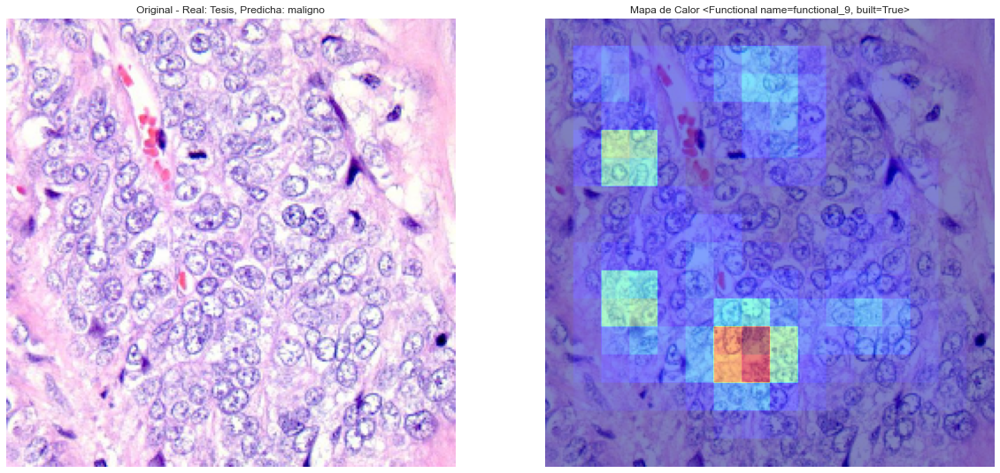

Entrenando el modelo densenet...
Epoch 1/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 251s 615ms/step - accuracy: 0.9521 - loss: 0.1085 - val_accuracy: 0.9973 - val_loss: 0.0068
Epoch 2/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 242s 605ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.9993 - val_loss: 0.0025
Epoch 3/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 243s 607ms/step - accuracy: 0.9972 - loss: 0.0090 - val_accuracy: 0.9993 - val_loss: 0.0018
Epoch 4/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 243s 606ms/step - accuracy: 0.9999 - loss: 0.0011 - val_accuracy: 0.9993 - val_loss: 0.0015
Epoch 5/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 243s 607ms/step - accuracy: 1.0000 - loss: 3.1123e-04 - val_accuracy: 0.9987 - val_loss: 0.0014
Epoch 6/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 243s 606ms/step - accuracy: 0.9999 - loss: 4.0688e-04 - val_accuracy: 0.9973 - val_loss: 0.0038
Epoch 7/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 243s 607ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.9987 - val_loss: 0.0026
Epoch 8/10
400/400 ━━━━━━━━━━━━━━━━

Modelo densenet entrenado con éxito
75/75 ━━━━━━━━━━━━━━━━━━━━ 39s 497ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 12s 495ms/step
Final Validation Metrics for densenet: Accuracy=0.9993, Recall=0.9987, Precision=1.0000, F1=0.9993
Final Test Metrics for densenet: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000


C:\Users\Matias\AppData\Local\Temp\ipykernel_61956\417376711.py:162: RuntimeWarning: invalid value encountered in divide
  mapa_calor = mapa_calor / np.max(mapa_calor)


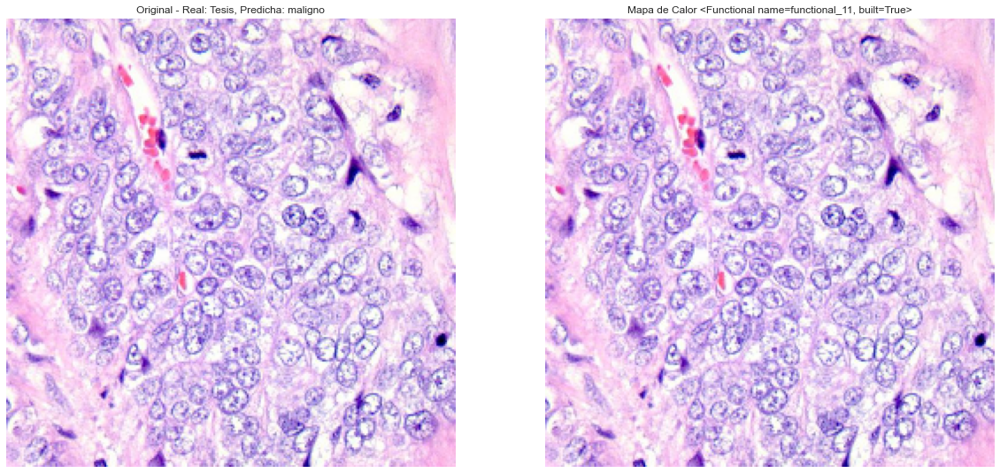

In [8]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train, df_val, df_test = dividir_dataframe(df)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train, df_val)
test_gen = crear_generador_test(df_test)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'all', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    aplicar_modelo_a_carpeta(carpeta_imagenes, model, model_name ,tamano_parche=32, paso=16)

## Modelo Binario Pulmon

In [11]:
df_pulmon = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='lung')
train_loader_pulmon, val_loader_pulmon, test_loader_pulmon = qol.prepare_data_loaders(df_pulmon, batch_size=40, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_pulmon, test_size=0.3, random_state=46, stratify=df_pulmon['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])




In [14]:

'''model_bmgl= bmgl.train_model(device, train_loader_pulmon, val_loader_pulmon)
torch.save(model_bmgl, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pth')
torch.save(model_bmgl, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pt')

'''

model_bmgl = torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pth')

model_bmgl.to(device)

model_bmgl.eval()

try:
    test_accuracy = qol.evaluate_model(device, model_bmgl, test_loader_pulmon)
    # Evaluar el modelo cargado
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgl, val_loader_pulmon, test_loader_pulmon)
    
    # Acceder a los valores para validación
    val_accuracy, val_recall, val_precision, val_f1, val_cm, val_loss, val_loss_list = val_metrics
    
    # Acceder a los valores para test
    test_accuracy, test_recall, test_precision, test_f1, test_cm, test_loss, test_loss_list = test_metrics

    # Imprimir las métricas y listas de pérdidas
    print(f'Validation Accuracy: {val_accuracy:.4f}')
    print(f'Validation Loss (avg): {val_loss:.4f}')
    print(f'Validation Loss List: {val_loss_list}')
    
    print(f'Test Accuracy: {test_accuracy:.4f}')
    print(f'Test Loss (avg): {test_loss:.4f}')
    print(f'Test Loss List: {test_loss_list}')
    print(f'Test Recall: {test_recall:.4f}')
    print(f'Test Precision: {test_precision:.4f}')
    print(f'Test F1: {test_f1:.4f}')
    print(f'Test Confusion Matrix:\n{test_cm}')
    

except Exception as e:
    print(f'Error: {e}')

print('Modelo General')
try:
    test_accuracy = qol.evaluate_model(device, model_bmg, test_loader_pulmon)
    # Evaluar el modelo cargado
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmg, val_loader_pulmon, test_loader_pulmon)
    
    # Acceder a los valores para validación
    val_accuracy, val_recall, val_precision, val_f1, val_cm, val_loss, val_loss_list = val_metrics
    
    # Acceder a los valores para test
    test_accuracy, test_recall, test_precision, test_f1, test_cm, test_loss, test_loss_list = test_metrics

    # Imprimir las métricas y listas de pérdidas
    print(f'Validation Accuracy: {val_accuracy:.4f}')
    print(f'Validation Loss (avg): {val_loss:.4f}')
    print(f'Validation Loss List: {val_loss_list}')
    
    print(f'Test Accuracy: {test_accuracy:.4f}')
    print(f'Test Loss (avg): {test_loss:.4f}')
    print(f'Test Loss List: {test_loss_list}')
    print(f'Test Recall: {test_recall:.4f}')
    print(f'Test Precision: {test_precision:.4f}')
    print(f'Test F1: {test_f1:.4f}')
    print(f'Test Confusion Matrix:\n{test_cm}')
    

except Exception as e:
    print(f'Error: {e}')

Test Accuracy: 0.9993
Validation Accuracy: 0.9987
Validation Loss (avg): 0.0207
Validation Loss (list): [0.0, 2.142695166185149e-06, 0.0, 2.9802320611338473e-09, 2.1859385014977306e-05, 8.940695295223122e-09, 1.7881387037732566e-08, 2.2649662412277394e-07, 0.7521066665649414, 0.0, 4.33887589679216e-06, 2.3841845830929742e-08, 0.0, 0.0, 0.0, 0.2135479748249054, 5.960464122267695e-09, 2.9802320611338473e-09, 0.0, 0.0, 1.9609158243838465e-06, 0.0, 0.0009367638267576694, 0.0, 3.6117805848334683e-06, 0.0, 8.468572923447937e-05, 0.0, 4.88753300942335e-07, 3.9335968722298276e-06, 5.364412203334723e-08, 0.0, 0.0, 0.0, 2.9802320611338473e-09, 0.0, 0.0, 0.006666561122983694, 6.943847097318212e-07, 0.0, 0.2377767115831375, 2.9802320611338473e-09, 0.0004289218341000378, 0.00020095487707294524, 0.0, 2.6523940732658957e-07, 0.0, 0.0, 4.172323286866231e-08, 6.258479601228828e-08, 0.0, 2.980230462412692e-08, 1.624305878067389e-05, 0.0, 0.0, 2.9802320611338473e-09, 4.918799822917208e-05, 0.0, 1.4007054

Matriz de confusión sin normalización


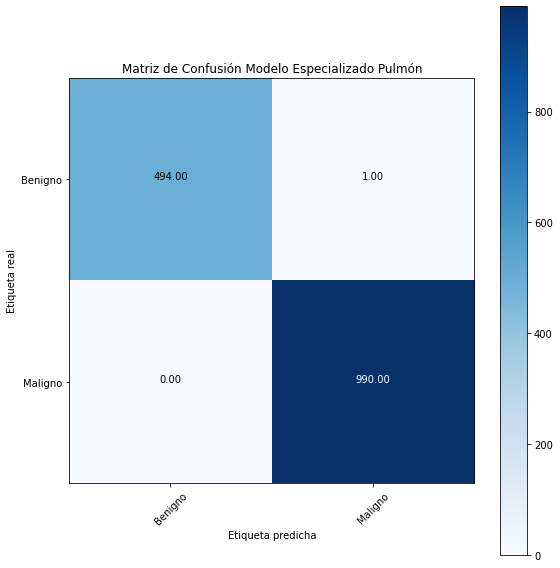

Matriz de confusión sin normalización


<Figure size 432x288 with 0 Axes>

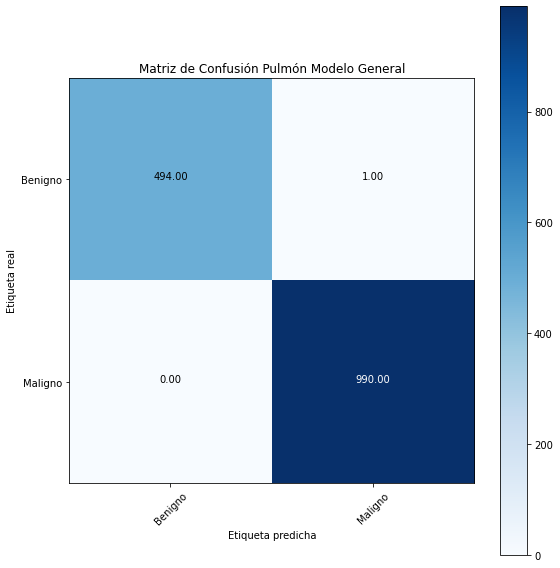

<Figure size 432x288 with 0 Axes>

In [13]:
# Matriz de confusión proporcionada
conf_matrix = np.array([[494, 1], [0, 990]])

# Etiquetas de las clases (ajustar según tu caso)
class_names = ['Benigno', 'Maligno']

# Ruta donde se guardará el gráfico
ruta = "C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/Pulmon"  # Cambia esto a la ruta de tu preferencia

# Llamada a la función para graficar
plot_confusion_matrix(conf_matrix, classes=class_names, title='Matriz de Confusión Modelo Especializado Pulmón',ruta=ruta, normalize=False)


# Matriz de confusión proporcionada
conf_matrix = np.array([[494, 1], [0, 990]])

# Etiquetas de las clases (ajustar según tu caso)
class_names = ['Benigno', 'Maligno']

# Ruta donde se guardará el gráfico
ruta = "C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/Pulmon"  # Cambia esto a la ruta de tu preferencia

# Llamada a la función para graficar
plot_confusion_matrix(conf_matrix, classes=class_names, title='Matriz de Confusión Pulmón Modelo General', ruta=ruta, normalize=False)

In [ ]:
carpeta_imagenes = r"C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/Pulmon"
aplicar_modelo_a_carpeta(carpeta_imagenes, model_bmgl,model_name= 'model_bmgl', tamano_parche=32, paso=16)

# Obtener y graficar la matriz de confusión para validación y test
val_cm = val_metrics[4]  # Matriz de confusión para validación
test_cm = test_metrics[4]  # Matriz de confusión para test

# Visualización de la matriz de confusión
plot_confusion_matrix(val_cm, ruta = carpeta_imagenes, classes=['Benigno', 'Maligno'], title='Matriz de Confusión pulmon (Validación)')
plot_confusion_matrix(test_cm, ruta = carpeta_imagenes, classes=['Benigno', 'Maligno'], title='Matriz de Confusión pulmon (Test)')

### Redes preentrenadas

DataFrames divididos con éxito
Found 12000 validated image filenames belonging to 2 classes.
Found 2250 validated image filenames belonging to 2 classes.
Found 750 validated image filenames belonging to 2 classes.
Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/10


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


600/600 ━━━━━━━━━━━━━━━━━━━━ 277s 457ms/step - accuracy: 0.6561 - loss: 0.6648 - val_accuracy: 0.8676 - val_loss: 0.4502
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 276s 459ms/step - accuracy: 0.8164 - loss: 0.4234 - val_accuracy: 0.6969 - val_loss: 0.5554
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 274s 456ms/step - accuracy: 0.8788 - loss: 0.2877 - val_accuracy: 0.9467 - val_loss: 0.1758
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 275s 458ms/step - accuracy: 0.9221 - loss: 0.2059 - val_accuracy: 0.9427 - val_loss: 0.1681
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 274s 456ms/step - accuracy: 0.9355 - loss: 0.1709 - val_accuracy: 0.9311 - val_loss: 0.1766
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 274s 456ms/step - accuracy: 0.9291 - loss: 0.1786 - val_accuracy: 0.8458 - val_loss: 0.3257
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 272s 454ms/step - accuracy: 0.9340 - loss: 0.1572 - val_accuracy: 0.9582 - val_loss: 0.1068
Epoch 8/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 274s 457ms/step - accuracy: 0.9365 - loss: 0.15

Modelo resnet entrenado con éxito
113/113 ━━━━━━━━━━━━━━━━━━━━ 45s 392ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


38/38 ━━━━━━━━━━━━━━━━━━━━ 14s 380ms/step
Final Validation Metrics for resnet: Accuracy=0.9604, Recall=0.9874, Precision=0.9551, F1=0.9710
Final Test Metrics for resnet: Accuracy=0.9547, Recall=0.9800, Precision=0.9532, F1=0.9664


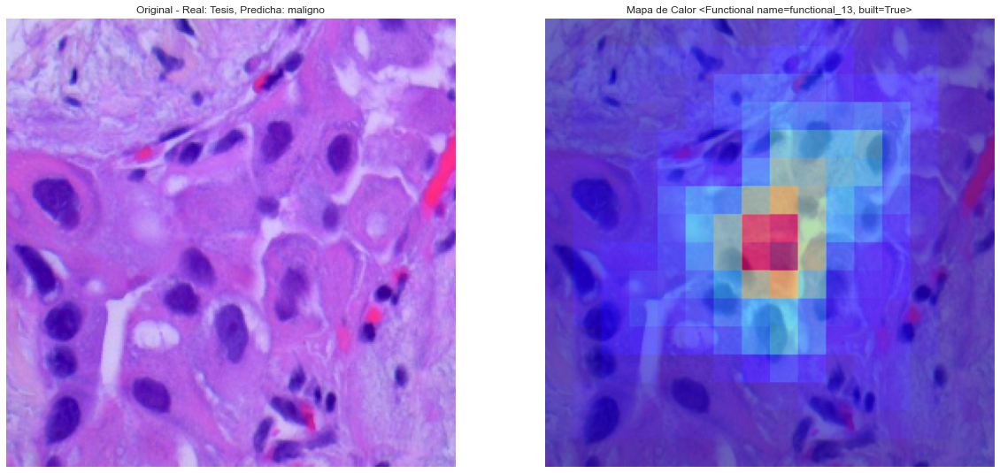

Entrenando el modelo vgg...
Epoch 1/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 642s 1s/step - accuracy: 0.9711 - loss: 0.1051 - val_accuracy: 0.9889 - val_loss: 0.0314
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 638s 1s/step - accuracy: 0.9963 - loss: 0.0113 - val_accuracy: 0.9982 - val_loss: 0.0049
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 637s 1s/step - accuracy: 0.9978 - loss: 0.0062 - val_accuracy: 0.9951 - val_loss: 0.0143
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 639s 1s/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.9996 - val_loss: 0.0014
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 639s 1s/step - accuracy: 0.9988 - loss: 0.0036 - val_accuracy: 0.9996 - val_loss: 0.0016
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 639s 1s/step - accuracy: 0.9988 - loss: 0.0032 - val_accuracy: 0.9982 - val_loss: 0.0038
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 639s 1s/step - accuracy: 0.9995 - loss: 0.0017 - val_accuracy: 1.0000 - val_loss: 6.8783e-04
Epoch 8/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 640s 1s/step - accuracy: 

Modelo vgg entrenado con éxito
113/113 ━━━━━━━━━━━━━━━━━━━━ 101s 895ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 34s 882ms/step
Final Validation Metrics for vgg: Accuracy=0.9987, Recall=1.0000, Precision=0.9980, F1=0.9990
Final Test Metrics for vgg: Accuracy=0.9960, Recall=1.0000, Precision=0.9940, F1=0.9970


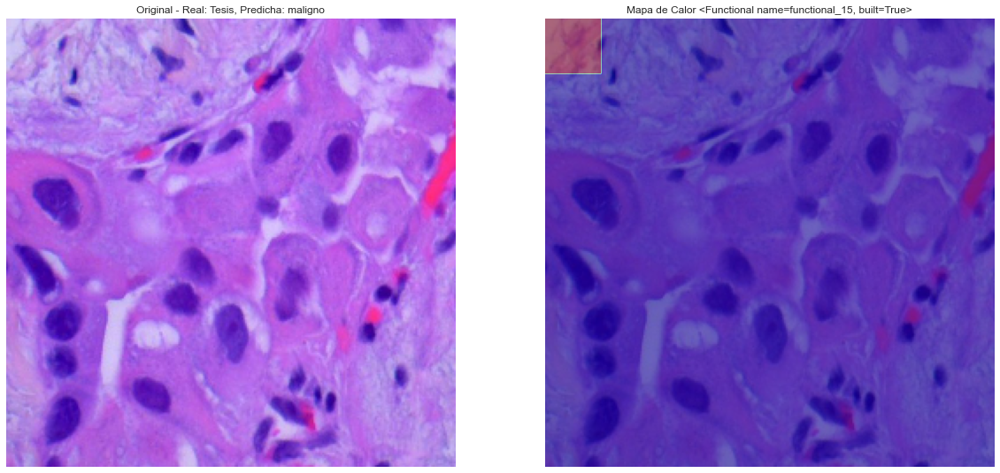

Entrenando el modelo densenet...
Epoch 1/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 338s 553ms/step - accuracy: 0.9856 - loss: 0.0360 - val_accuracy: 1.0000 - val_loss: 0.0014
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 325s 542ms/step - accuracy: 0.9998 - loss: 4.8939e-04 - val_accuracy: 1.0000 - val_loss: 2.4098e-04
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 325s 541ms/step - accuracy: 1.0000 - loss: 9.6793e-05 - val_accuracy: 1.0000 - val_loss: 1.7736e-04
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 325s 541ms/step - accuracy: 1.0000 - loss: 4.8506e-05 - val_accuracy: 1.0000 - val_loss: 1.1983e-04
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 324s 540ms/step - accuracy: 1.0000 - loss: 3.9421e-05 - val_accuracy: 1.0000 - val_loss: 1.1572e-04
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 324s 539ms/step - accuracy: 1.0000 - loss: 2.3046e-05 - val_accuracy: 1.0000 - val_loss: 6.4306e-05
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 324s 540ms/step - accuracy: 1.0000 - loss: 1.3225e-05 - val_accuracy: 1.0000 - val_loss: 6.0694

Modelo densenet entrenado con éxito
113/113 ━━━━━━━━━━━━━━━━━━━━ 53s 457ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 16s 428ms/step
Final Validation Metrics for densenet: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000
Final Test Metrics for densenet: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000


C:\Users\Matias\AppData\Local\Temp\ipykernel_61956\417376711.py:162: RuntimeWarning: invalid value encountered in divide
  mapa_calor = mapa_calor / np.max(mapa_calor)


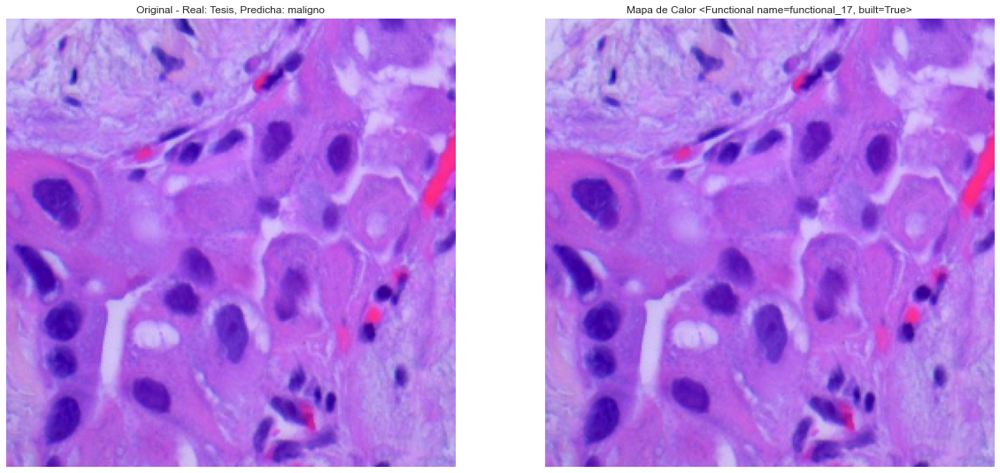

In [12]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train, df_val, df_test = dividir_dataframe(df)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train, df_val)
test_gen = crear_generador_test(df_test)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'all', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    aplicar_modelo_a_carpeta(carpeta_imagenes, model, model_name ,tamano_parche=32, paso=16)

## Modelo Binario Gastrointestinal

In [15]:
df_gastrointestinal = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='gastrointestinal')
train_loader_gastrointestinal, val_loader_gastrointestinal, test_loader_gastrointestinal = qol.prepare_data_loaders(df_gastrointestinal, batch_size=40, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_gastrointestinal, test_size=0.3, random_state=46, stratify=df_gastrointestinal['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])




In [16]:

# Entrenar modelo
'''model_bmgg= bmgg.train_model(device, train_loader_gastrointestinal, val_loader_gastrointestinal)
torch.save(model_bmgg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgg.pth')
torch.save(model_bmgg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgg.pt')'''



model_bmgg = torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgg.pth')

model_bmgg.to(device)

model_bmgg.eval()

try:
    test_accuracy = qol.evaluate_model(device, model_bmgg, test_loader_gastrointestinal)
    # Evaluar el modelo cargado
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgg, val_loader_gastrointestinal, test_loader_gastrointestinal)
    
    # Acceder a los valores para validación
    val_accuracy, val_recall, val_precision, val_f1, val_cm, val_loss, val_loss_list = val_metrics
    
    # Acceder a los valores para test
    test_accuracy, test_recall, test_precision, test_f1, test_cm, test_loss, test_loss_list = test_metrics

    # Imprimir las métricas y listas de pérdidas
    print(f'Validation Accuracy: {val_accuracy:.4f}')
    print(f'Validation Loss (avg): {val_loss:.4f}')
    print(f'Validation Loss List: {val_loss_list}')
    
    print(f'Test Accuracy: {test_accuracy:.4f}')
    print(f'Test Loss (avg): {test_loss:.4f}')
    print(f'Test Loss List: {test_loss_list}')
    print(f'Test Recall: {test_recall:.4f}')
    print(f'Test Precision: {test_precision:.4f}')
    print(f'Test F1: {test_f1:.4f}')
    print(f'Test Confusion Matrix:\n{test_cm}')
    

except Exception as e:
    print(f'Error: {e}')

print('Modelo General')
try:
    test_accuracy = qol.evaluate_model(device, model_bmg, test_loader_gastrointestinal)
    # Evaluar el modelo cargado
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmg, val_loader_gastrointestinal, test_loader_gastrointestinal)
    
    # Acceder a los valores para validación
    val_accuracy, val_recall, val_precision, val_f1, val_cm, val_loss, val_loss_list = val_metrics
    
    # Acceder a los valores para test
    test_accuracy, test_recall, test_precision, test_f1, test_cm, test_loss, test_loss_list = test_metrics

    # Imprimir las métricas y listas de pérdidas
    print(f'Validation Accuracy: {val_accuracy:.4f}')
    print(f'Validation Loss (avg): {val_loss:.4f}')
    print(f'Validation Loss List: {val_loss_list}')
    
    print(f'Test Accuracy: {test_accuracy:.4f}')
    print(f'Test Loss (avg): {test_loss:.4f}')
    print(f'Test Loss List: {test_loss_list}')
    print(f'Test Recall: {test_recall:.4f}')
    print(f'Test Precision: {test_precision:.4f}')
    print(f'Test F1: {test_f1:.4f}')
    print(f'Test Confusion Matrix:\n{test_cm}')
    

except Exception as e:
    print(f'Error: {e}')

Test Accuracy: 0.9837
Validation Accuracy: 0.9882
Validation Loss (avg): 0.0722
Validation Loss (list): [0.009315737523138523, 0.009499060921370983, 2.634064367157407e-05, 0.17651164531707764, 0.1191181167960167, 1.7629256035434082e-05, 0.00013690539344679564, 0.01224435679614544, 0.2073882818222046, 3.160242340527475e-05, 0.2890884280204773, 0.02100948430597782, 0.006317459046840668, 0.000630969472695142, 0.006109324283897877, 0.2254176139831543, 0.04384980723261833, 0.046240419149398804, 7.743020250927657e-05, 0.09127070009708405, 0.00026174235972575843, 3.728492811205797e-05, 0.3257705569267273, 0.015567077323794365, 0.0012664488749578595, 0.0009935173438861966, 0.0002408528671367094, 8.873700426192954e-05, 0.0169451292604208, 0.020107831805944443, 0.2788899540901184, 0.1202407106757164, 0.11641152948141098, 7.045410893624648e-05, 0.1226915717124939, 0.04685790091753006, 0.0003051965613849461, 0.11949412524700165, 0.46809616684913635, 3.2870575523702428e-06, 5.308520849212073e-05]
T

Matriz de confusión sin normalización


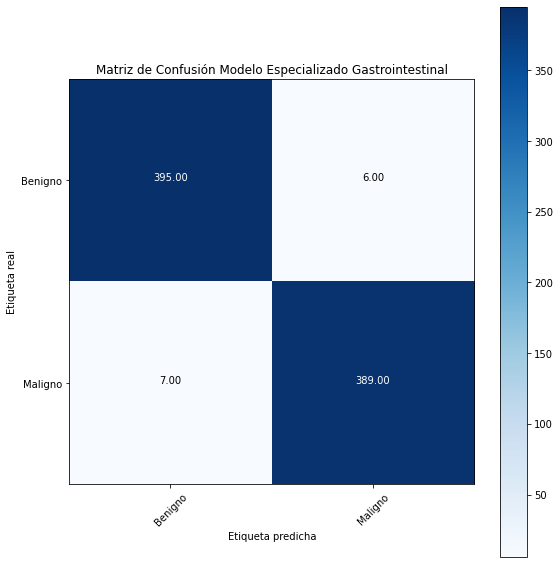

Matriz de confusión sin normalización


<Figure size 432x288 with 0 Axes>

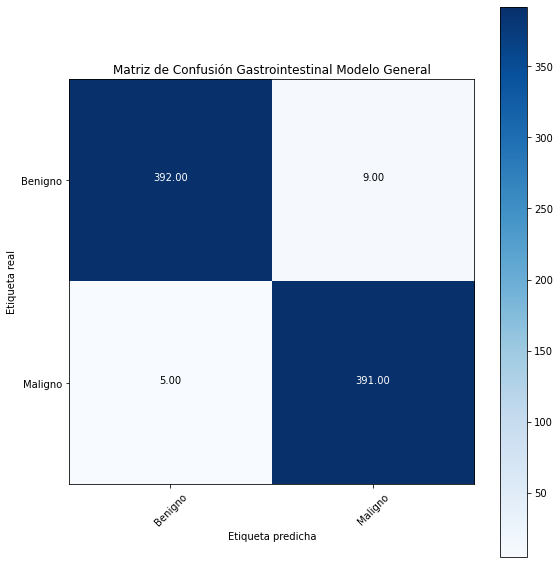

<Figure size 432x288 with 0 Axes>

In [17]:
# Matriz de confusión proporcionada
conf_matrix = np.array([[395, 6], [7, 389]])

# Etiquetas de las clases (ajustar según tu caso)
class_names = ['Benigno', 'Maligno']

# Ruta donde se guardará el gráfico
ruta = "C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/Gastrointestinal"  # Cambia esto a la ruta de tu preferencia

# Llamada a la función para graficar
plot_confusion_matrix(conf_matrix, classes=class_names, title='Matriz de Confusión Modelo Especializado Gastrointestinal',ruta=ruta, normalize=False)


# Matriz de confusión proporcionada
conf_matrix = np.array([[392, 9], [5, 391]])

# Etiquetas de las clases (ajustar según tu caso)
class_names = ['Benigno', 'Maligno']

# Ruta donde se guardará el gráfico
ruta = "C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/Pulmon"  # Cambia esto a la ruta de tu preferencia

# Llamada a la función para graficar
plot_confusion_matrix(conf_matrix, classes=class_names, title='Matriz de Confusión Gastrointestinal Modelo General', ruta=ruta, normalize=False)

In [ ]:
carpeta_imagenes = r"C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/Gastrointestinal"
aplicar_modelo_a_carpeta(carpeta_imagenes, model_bmgg,model_name='model_bmgg' , tamano_parche=32, paso=16)

# Obtener y graficar la matriz de confusión para validación y test
val_cm = val_metrics[4]  # Matriz de confusión para validación
test_cm = test_metrics[4]  # Matriz de confusión para test

# Visualización de la matriz de confusión
plot_confusion_matrix(val_cm, ruta = carpeta_imagenes, classes=['Benigno', 'Maligno'], title='Matriz de Confusión gastrointestinal (Validación)')
plot_confusion_matrix(test_cm, ruta = carpeta_imagenes, classes=['Benigno', 'Maligno'], title='Matriz de Confusión gastrointestinal (Test)')

### Redes preentrenadas

DataFrames divididos con éxito
Found 6400 validated image filenames belonging to 2 classes.
Found 1200 validated image filenames belonging to 2 classes.
Found 400 validated image filenames belonging to 2 classes.
Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/10


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


320/320 ━━━━━━━━━━━━━━━━━━━━ 150s 458ms/step - accuracy: 0.6734 - loss: 0.6749 - val_accuracy: 0.7550 - val_loss: 0.5268
Epoch 2/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 146s 455ms/step - accuracy: 0.7456 - loss: 0.5150 - val_accuracy: 0.7575 - val_loss: 0.4779
Epoch 3/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 146s 455ms/step - accuracy: 0.7557 - loss: 0.5061 - val_accuracy: 0.7867 - val_loss: 0.4628
Epoch 4/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 147s 458ms/step - accuracy: 0.7754 - loss: 0.4823 - val_accuracy: 0.7875 - val_loss: 0.4411
Epoch 5/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 147s 457ms/step - accuracy: 0.7810 - loss: 0.4668 - val_accuracy: 0.8033 - val_loss: 0.4446
Epoch 6/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 147s 458ms/step - accuracy: 0.7666 - loss: 0.4846 - val_accuracy: 0.7567 - val_loss: 0.4755
Epoch 7/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 148s 459ms/step - accuracy: 0.7914 - loss: 0.4556 - val_accuracy: 0.7483 - val_loss: 0.5017
Epoch 8/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 147s 458ms/step - accuracy: 0.7979 - loss: 0.44

Modelo resnet entrenado con éxito
60/60 ━━━━━━━━━━━━━━━━━━━━ 24s 386ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 384ms/step
Final Validation Metrics for resnet: Accuracy=0.7908, Recall=0.8831, Precision=0.7524, F1=0.8125
Final Test Metrics for resnet: Accuracy=0.8000, Recall=0.8883, Precision=0.7389, F1=0.8068


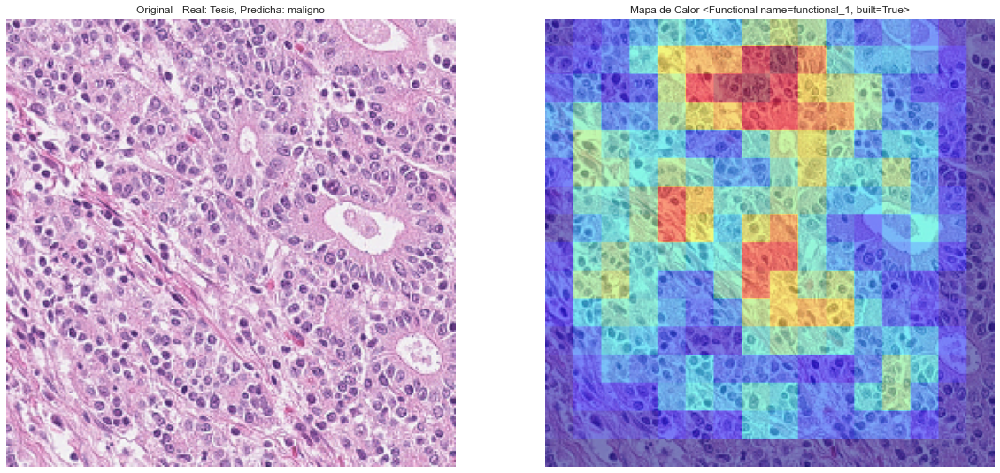

Entrenando el modelo vgg...
Epoch 1/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 345s 1s/step - accuracy: 0.9151 - loss: 0.2024 - val_accuracy: 0.9825 - val_loss: 0.0663
Epoch 2/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 344s 1s/step - accuracy: 0.9803 - loss: 0.0567 - val_accuracy: 0.9842 - val_loss: 0.0394
Epoch 3/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 344s 1s/step - accuracy: 0.9871 - loss: 0.0351 - val_accuracy: 0.9867 - val_loss: 0.0370
Epoch 4/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 344s 1s/step - accuracy: 0.9856 - loss: 0.0389 - val_accuracy: 0.9892 - val_loss: 0.0285
Epoch 5/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 344s 1s/step - accuracy: 0.9893 - loss: 0.0344 - val_accuracy: 0.9900 - val_loss: 0.0285
Epoch 6/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 345s 1s/step - accuracy: 0.9941 - loss: 0.0172 - val_accuracy: 0.9883 - val_loss: 0.0278
Epoch 7/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 344s 1s/step - accuracy: 0.9913 - loss: 0.0263 - val_accuracy: 0.9875 - val_loss: 0.0247
Epoch 8/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 344s 1s/step - accuracy: 0.99

Modelo vgg entrenado con éxito
60/60 ━━━━━━━━━━━━━━━━━━━━ 55s 908ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 18s 902ms/step
Final Validation Metrics for vgg: Accuracy=0.9925, Recall=0.9870, Precision=0.9984, F1=0.9927
Final Test Metrics for vgg: Accuracy=0.9925, Recall=0.9840, Precision=1.0000, F1=0.9920


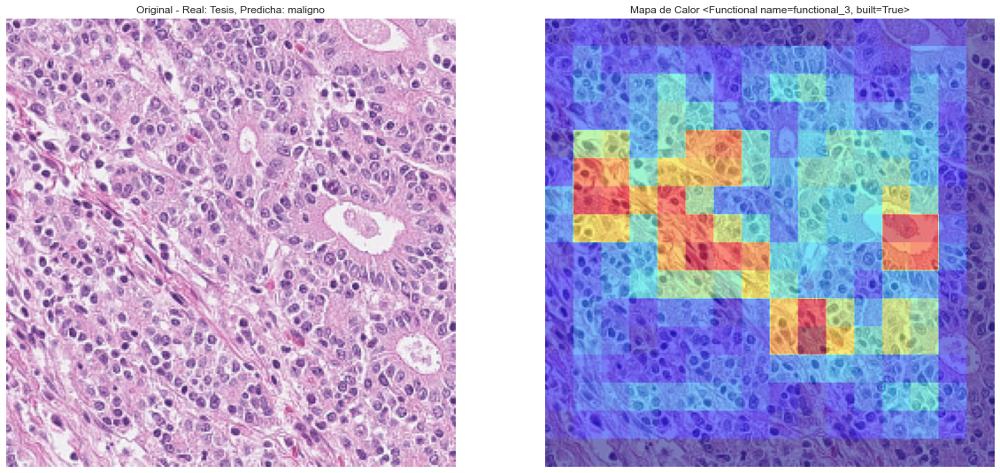

Entrenando el modelo densenet...
Epoch 1/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 179s 542ms/step - accuracy: 0.9660 - loss: 0.0907 - val_accuracy: 0.9917 - val_loss: 0.0223
Epoch 2/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 167s 520ms/step - accuracy: 0.9939 - loss: 0.0195 - val_accuracy: 0.9925 - val_loss: 0.0166
Epoch 3/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 166s 515ms/step - accuracy: 0.9927 - loss: 0.0191 - val_accuracy: 0.9950 - val_loss: 0.0129
Epoch 4/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 166s 517ms/step - accuracy: 0.9972 - loss: 0.0081 - val_accuracy: 0.9950 - val_loss: 0.0097
Epoch 5/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 167s 520ms/step - accuracy: 0.9966 - loss: 0.0074 - val_accuracy: 0.9825 - val_loss: 0.0396
Epoch 6/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 167s 521ms/step - accuracy: 0.9960 - loss: 0.0118 - val_accuracy: 0.9958 - val_loss: 0.0173
Epoch 7/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 167s 520ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.9975 - val_loss: 0.0059
Epoch 8/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 168

Modelo densenet entrenado con éxito
60/60 ━━━━━━━━━━━━━━━━━━━━ 28s 444ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 443ms/step
Final Validation Metrics for densenet: Accuracy=0.9942, Recall=0.9984, Precision=0.9903, F1=0.9943
Final Test Metrics for densenet: Accuracy=0.9975, Recall=1.0000, Precision=0.9947, F1=0.9973


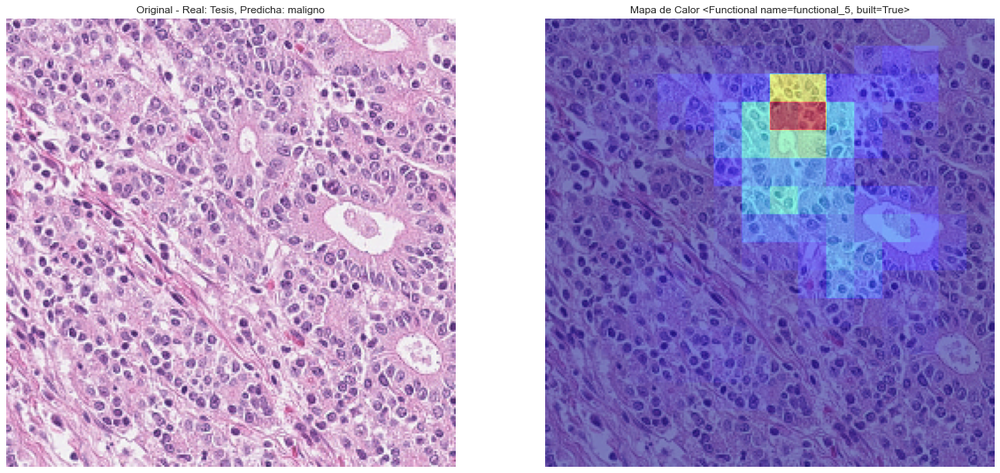

In [8]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train, df_val, df_test = dividir_dataframe(df)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train, df_val)
test_gen = crear_generador_test(df_test)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'all', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    aplicar_modelo_a_carpeta(carpeta_imagenes, model, model_name ,tamano_parche=32, paso=16)

## Modelo Binario Oral

In [19]:
df_oral = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='oral')
train_loader_oral, val_loader_oral, test_loader_oral = qol.prepare_data_loaders(df_oral, batch_size=20, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_oral, test_size=0.3, random_state=46, stratify=df_oral['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])





In [20]:

# Entrenar modelo
'''model_bmgo= bmgo.train_model(device, train_loader_oral, val_loader_oral)
torch.save(model_bmgo, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pth')
torch.save(model_bmgo, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pt')'''




model_bmgo = torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pth')

model_bmgo.to(device)

model_bmgo.eval()

try:
    test_accuracy = qol.evaluate_model(device, model_bmgo, test_loader_oral)
    # Evaluar el modelo cargado
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgo, val_loader_oral, test_loader_oral)
    
    # Acceder a los valores para validación
    val_accuracy, val_recall, val_precision, val_f1, val_cm, val_loss, val_loss_list = val_metrics
    
    # Acceder a los valores para test
    test_accuracy, test_recall, test_precision, test_f1, test_cm, test_loss, test_loss_list = test_metrics

    # Imprimir las métricas y listas de pérdidas
    print(f'Validation Accuracy: {val_accuracy:.4f}')
    print(f'Validation Loss (avg): {val_loss:.4f}')
    print(f'Validation Loss List: {val_loss_list}')
    
    print(f'Test Accuracy: {test_accuracy:.4f}')
    print(f'Test Loss (avg): {test_loss:.4f}')
    print(f'Test Loss List: {test_loss_list}')
    print(f'Test Recall: {test_recall:.4f}')
    print(f'Test Precision: {test_precision:.4f}')
    print(f'Test F1: {test_f1:.4f}')
    print(f'Test Confusion Matrix:\n{test_cm}')
    

except Exception as e:
    print(f'Error: {e}')

print('Modelo General')
try:
    test_accuracy = qol.evaluate_model(device, model_bmg, test_loader_oral)
    # Evaluar el modelo cargado
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmg, val_loader_oral, test_loader_oral)
    
    # Acceder a los valores para validación
    val_accuracy, val_recall, val_precision, val_f1, val_cm, val_loss, val_loss_list = val_metrics
    
    # Acceder a los valores para test
    test_accuracy, test_recall, test_precision, test_f1, test_cm, test_loss, test_loss_list = test_metrics

    # Imprimir las métricas y listas de pérdidas
    print(f'Validation Accuracy: {val_accuracy:.4f}')
    print(f'Validation Loss (avg): {val_loss:.4f}')
    print(f'Validation Loss List: {val_loss_list}')
    
    print(f'Test Accuracy: {test_accuracy:.4f}')
    print(f'Test Loss (avg): {test_loss:.4f}')
    print(f'Test Loss List: {test_loss_list}')
    print(f'Test Recall: {test_recall:.4f}')
    print(f'Test Precision: {test_precision:.4f}')
    print(f'Test F1: {test_f1:.4f}')
    print(f'Test Confusion Matrix:\n{test_cm}')
    

except Exception as e:
    print(f'Error: {e}')

Test Accuracy: 0.8921
Validation Accuracy: 0.9029
Validation Loss (avg): 0.3629
Validation Loss (list): [0.18106365203857422, 0.5529477000236511, 0.6998333930969238, 0.5105383992195129, 0.4923092722892761, 0.5136963129043579, 0.07261466234922409, 0.1571083664894104, 0.3955111503601074, 0.21520264446735382, 0.015051501803100109, 0.6693061590194702, 0.8327069282531738, 0.4369395673274994, 0.6916345357894897, 0.2067699432373047, 0.6281908750534058, 0.20054075121879578, 0.1436092108488083, 0.6162383556365967, 0.00762531254440546, 0.021038120612502098, 0.6689618825912476, 0.011247923597693443, 0.3609200119972229, 0.21323294937610626, 0.5291134119033813, 0.10086439549922943, 0.2843484878540039, 0.5504165291786194, 0.26419851183891296, 0.14596600830554962, 0.286135196685791, 0.39478760957717896, 0.28780397772789, 1.4304300546646118, 0.08835101872682571, 0.02243831753730774, 0.26726800203323364, 0.22144334018230438, 0.6156803369522095, 0.23377478122711182, 0.22179503738880157, 1.11613714694976

In [ ]:
carpeta_imagenes = r"C:/Users/Matias/Desktop/Tesis/Imagenes_grad_cam/Oral"
aplicar_modelo_a_carpeta(carpeta_imagenes, model_bmgo, model_name='model_bmgo' ,tamano_parche=32, paso=16)

# Obtener y graficar la matriz de confusión para validación y test
val_cm = val_metrics[4]  # Matriz de confusión para validación
test_cm = test_metrics[4]  # Matriz de confusión para test

# Visualización de la matriz de confusión
plot_confusion_matrix(val_cm, ruta = carpeta_imagenes, classes=['Benigno', 'Maligno'], title='Matriz de Confusión oral (Validación)')
plot_confusion_matrix(test_cm, ruta = carpeta_imagenes, classes=['Benigno', 'Maligno'], title='Matriz de Confusión oral (Test)')

### Redes Preentrenadas

DataFrames divididos con éxito
Found 9790 validated image filenames belonging to 2 classes.
Found 1841 validated image filenames belonging to 2 classes.
Found 609 validated image filenames belonging to 2 classes.


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 981 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 178 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 65 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(


Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/10


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


490/490 ━━━━━━━━━━━━━━━━━━━━ 227s 457ms/step - accuracy: 0.7485 - loss: 0.6034 - val_accuracy: 0.7653 - val_loss: 0.5689
Epoch 2/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 224s 457ms/step - accuracy: 0.7650 - loss: 0.5473 - val_accuracy: 0.7626 - val_loss: 0.5408
Epoch 3/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 224s 456ms/step - accuracy: 0.7646 - loss: 0.5378 - val_accuracy: 0.7626 - val_loss: 0.5325
Epoch 4/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 224s 457ms/step - accuracy: 0.7662 - loss: 0.5399 - val_accuracy: 0.7626 - val_loss: 0.5318
Epoch 5/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 224s 457ms/step - accuracy: 0.7553 - loss: 0.5482 - val_accuracy: 0.7626 - val_loss: 0.5370
Epoch 6/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 224s 457ms/step - accuracy: 0.7619 - loss: 0.5421 - val_accuracy: 0.7626 - val_loss: 0.5393
Epoch 7/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 224s 457ms/step - accuracy: 0.7680 - loss: 0.5324 - val_accuracy: 0.7626 - val_loss: 0.5303
Epoch 8/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 225s 458ms/step - accuracy: 0.7585 - loss: 0.54

Modelo resnet entrenado con éxito
93/93 ━━━━━━━━━━━━━━━━━━━━ 37s 391ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


31/31 ━━━━━━━━━━━━━━━━━━━━ 12s 381ms/step
Final Validation Metrics for resnet: Accuracy=0.7626, Recall=1.0000, Precision=0.7626, F1=0.8653
Final Test Metrics for resnet: Accuracy=0.7685, Recall=1.0000, Precision=0.7685, F1=0.8691


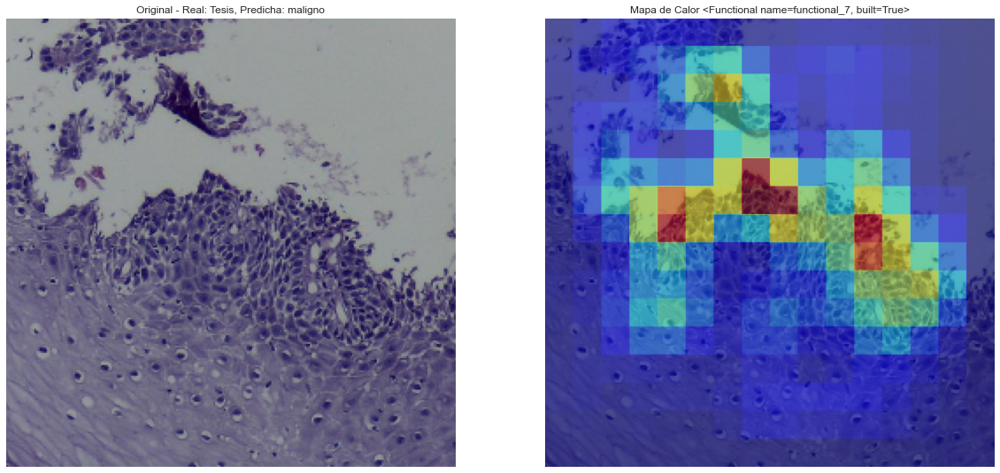

Entrenando el modelo vgg...
Epoch 1/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 525s 1s/step - accuracy: 0.7590 - loss: 0.5060 - val_accuracy: 0.7947 - val_loss: 0.4297
Epoch 2/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 524s 1s/step - accuracy: 0.7865 - loss: 0.4321 - val_accuracy: 0.8045 - val_loss: 0.3840
Epoch 3/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 524s 1s/step - accuracy: 0.8022 - loss: 0.4052 - val_accuracy: 0.8332 - val_loss: 0.3753
Epoch 4/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 524s 1s/step - accuracy: 0.8382 - loss: 0.3642 - val_accuracy: 0.8555 - val_loss: 0.3433
Epoch 5/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 524s 1s/step - accuracy: 0.8485 - loss: 0.3420 - val_accuracy: 0.8322 - val_loss: 0.3564
Epoch 6/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 524s 1s/step - accuracy: 0.8578 - loss: 0.3133 - val_accuracy: 0.8490 - val_loss: 0.3313
Epoch 7/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 524s 1s/step - accuracy: 0.8747 - loss: 0.2984 - val_accuracy: 0.8675 - val_loss: 0.2838
Epoch 8/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 524s 1s/step - accuracy: 0.89

Modelo vgg entrenado con éxito
93/93 ━━━━━━━━━━━━━━━━━━━━ 83s 892ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 28s 887ms/step
Final Validation Metrics for vgg: Accuracy=0.8935, Recall=0.9494, Precision=0.9143, F1=0.9315
Final Test Metrics for vgg: Accuracy=0.9048, Recall=0.9509, Precision=0.9271, F1=0.9388


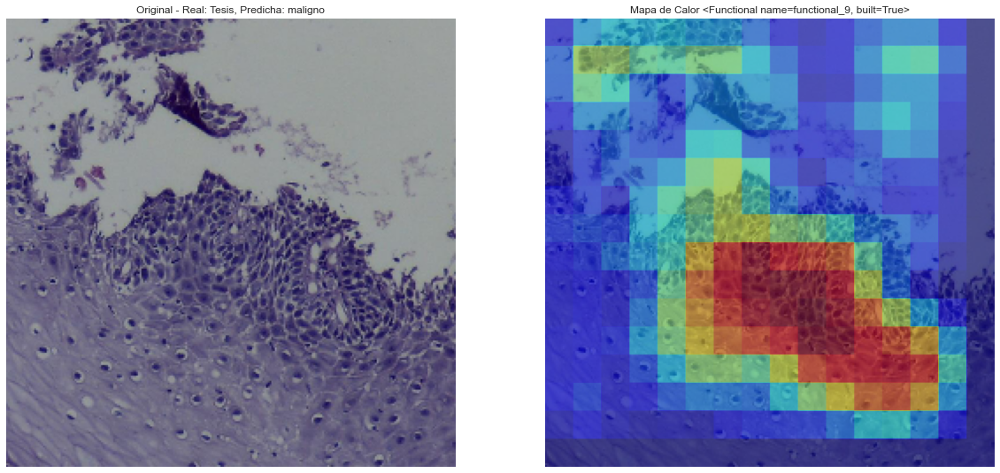

Entrenando el modelo densenet...
Epoch 1/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 312s 627ms/step - accuracy: 0.8081 - loss: 0.4157 - val_accuracy: 0.8772 - val_loss: 0.2872
Epoch 2/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 301s 614ms/step - accuracy: 0.8767 - loss: 0.2817 - val_accuracy: 0.8990 - val_loss: 0.2349
Epoch 3/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 301s 613ms/step - accuracy: 0.9153 - loss: 0.2024 - val_accuracy: 0.9250 - val_loss: 0.1919
Epoch 4/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 301s 613ms/step - accuracy: 0.9412 - loss: 0.1528 - val_accuracy: 0.9174 - val_loss: 0.1871
Epoch 5/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 301s 614ms/step - accuracy: 0.9513 - loss: 0.1291 - val_accuracy: 0.9441 - val_loss: 0.1261
Epoch 6/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 301s 615ms/step - accuracy: 0.9705 - loss: 0.0861 - val_accuracy: 0.9446 - val_loss: 0.1260
Epoch 7/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 302s 616ms/step - accuracy: 0.9703 - loss: 0.0782 - val_accuracy: 0.9435 - val_loss: 0.1372
Epoch 8/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 303

Modelo densenet entrenado con éxito
93/93 ━━━━━━━━━━━━━━━━━━━━ 52s 543ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 16s 520ms/step
Final Validation Metrics for densenet: Accuracy=0.9419, Recall=0.9943, Precision=0.9338, F1=0.9631
Final Test Metrics for densenet: Accuracy=0.9475, Recall=0.9957, Precision=0.9395, F1=0.9668


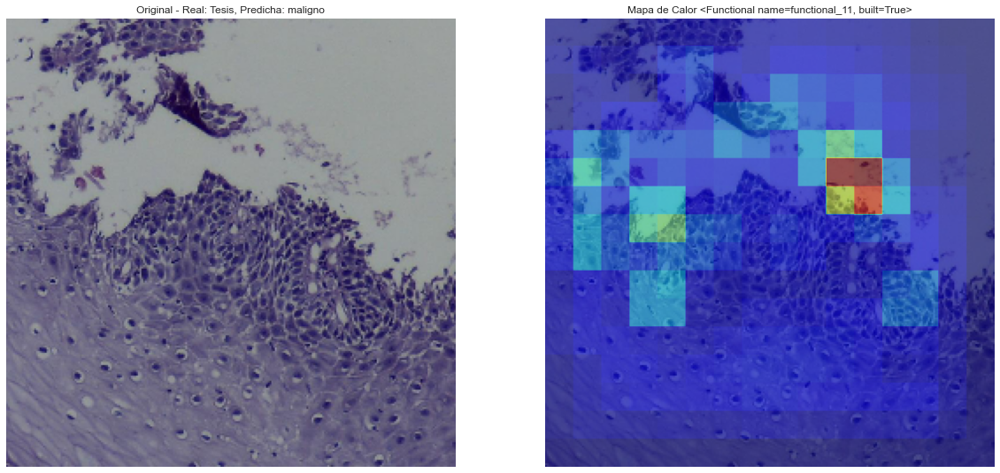

In [10]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train, df_val, df_test = dividir_dataframe(df)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train, df_val)
test_gen = crear_generador_test(df_test)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'all', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    aplicar_modelo_a_carpeta(carpeta_imagenes, model, model_name ,tamano_parche=32, paso=16)